In [148]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import datetime

import dateutil.relativedelta
import seaborn as sns
import sklearn

1.	Загрузить файл data_breast.csv. В данном файле собрана расчетная информация с обработанных изображений биоптата молочных желез женщин. Задача заключается в предсказании переменной “Diagnosis” - является ли содержимое биоптата доброкачественным (значение “B” – benign) либо злокачественным (значение “M” –malicious). Описание данных доступно на сайте

In [149]:
breast_df = pd.read_csv('data/data_breast.csv')

2.	Рассчитать основные статистики для переменных (среднее, медиана, мода, мин/макс, сред. отклонение).

In [150]:
breast_df.describe()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
count,5.690000e+02,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,0.0
mean,3.037183e+07,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,...,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946,NaN
std,1.250206e+08,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,...,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061,NaN
min,8.670000e+03,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,...,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040,NaN
25%,8.692180e+05,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,...,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460,NaN
50%,9.060240e+05,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,...,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040,NaN
75%,8.813129e+06,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,...,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080,NaN
max,9.113205e+08,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,...,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500,NaN


In [151]:
breast_df.select_dtypes(include=['object']).mode() 
# мода для признаков

,diagnosis
0,B


In [152]:
breast_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 33 columns):
id                         569 non-null int64
diagnosis                  569 non-null object
radius_mean                569 non-null float64
texture_mean               569 non-null float64
perimeter_mean             569 non-null float64
area_mean                  569 non-null float64
smoothness_mean            569 non-null float64
compactness_mean           569 non-null float64
concavity_mean             569 non-null float64
concave points_mean        569 non-null float64
symmetry_mean              569 non-null float64
fractal_dimension_mean     569 non-null float64
radius_se                  569 non-null float64
texture_se                 569 non-null float64
perimeter_se               569 non-null float64
area_se                    569 non-null float64
smoothness_se              569 non-null float64
compactness_se             569 non-null float64
concavity_se               569 non

In [153]:
#  Diagnosis (M = malignant = 1, B = benign = 0) 
breast_df.loc[breast_df.diagnosis == 'M' , 'diagnosis'] = 1
breast_df.loc[breast_df.diagnosis == 'B' , 'diagnosis'] = 0

3.	Выбрать стратегию для работы с пропущенными значениями.

In [154]:
breast_df = breast_df.drop(['Unnamed: 32'], axis=1)

In [155]:
breast_df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [156]:
breast_df.columns

Index(['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst'],
      dtype='object')

4.	Рассчитать и визуализировать корреляционную матрицу для переменных.

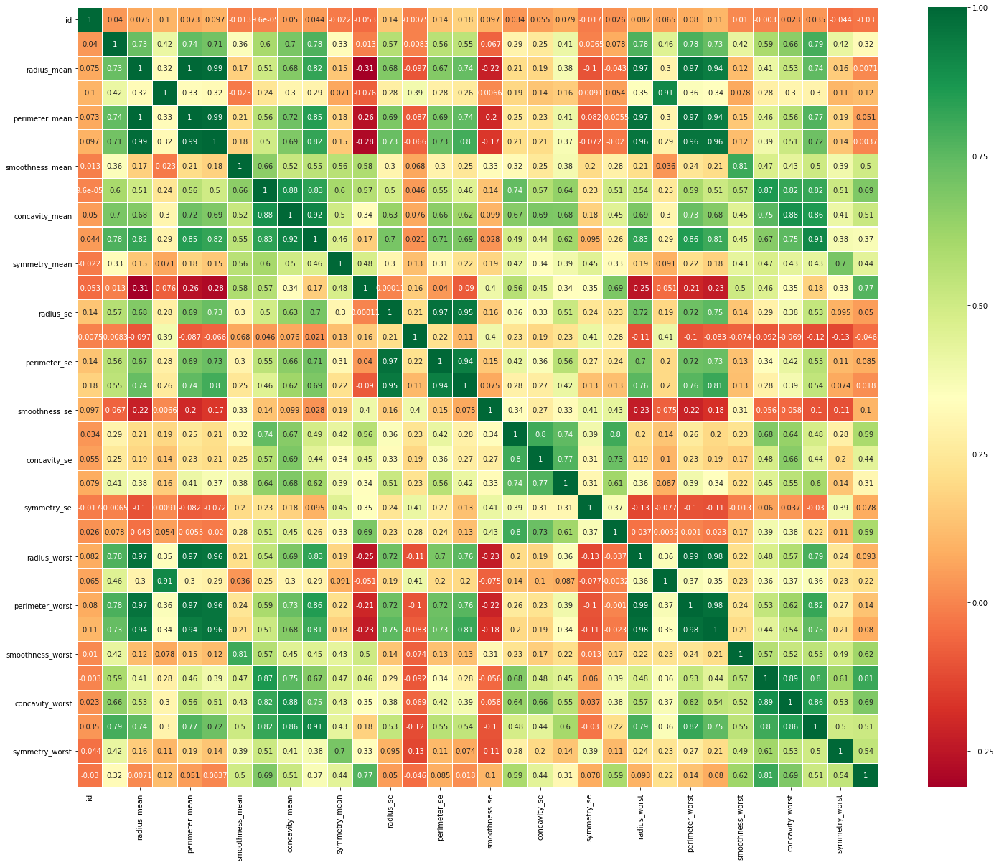

In [157]:
sns.heatmap(breast_df.corr(),annot=True,cmap='RdYlGn',linewidths=0.1) #data.corr()-->correlation matrix
fig=plt.gcf()
fig=plt.gcf()
fig.set_size_inches(25,20)

5.	Визуализировать взаимосвязи между переменными (scatter plots, гистограммы, …).

/home/darya/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/home/darya/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:488: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/darya/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2
/home/darya/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:83: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


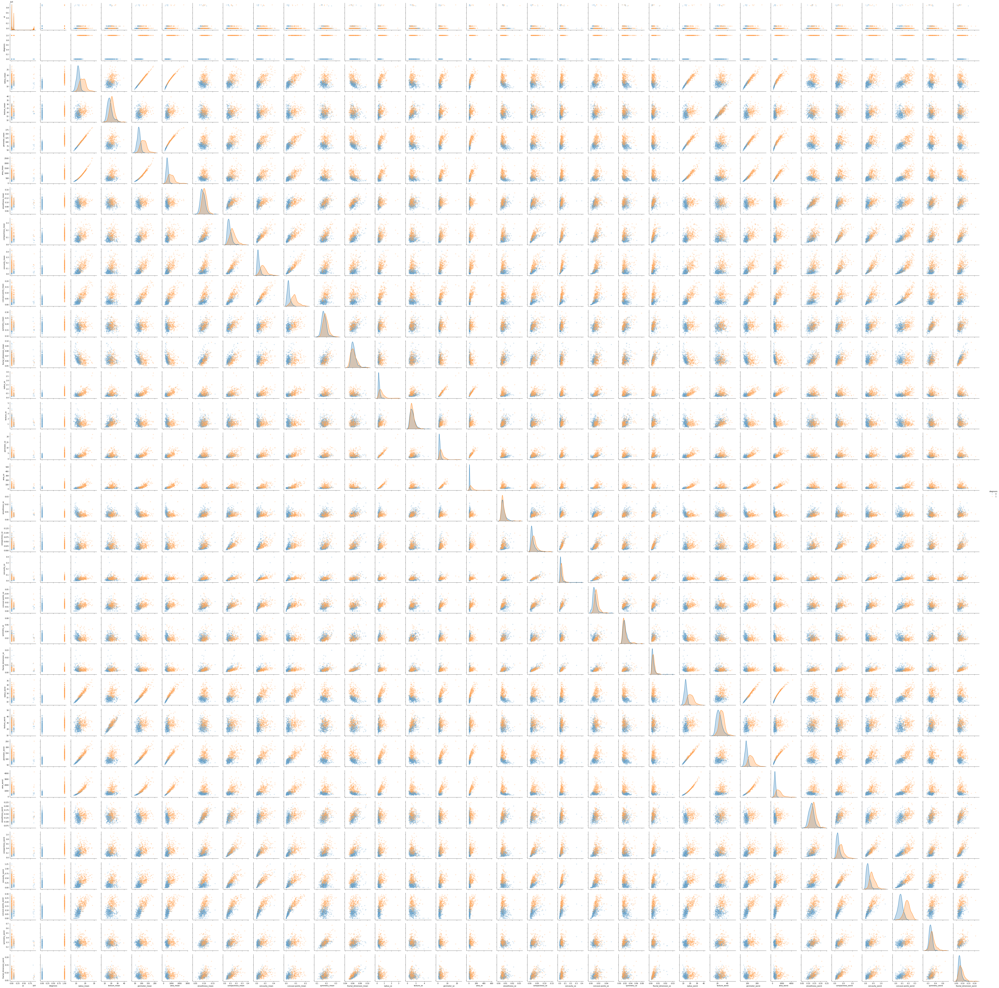

In [11]:
graph = sns.pairplot(data=breast_df ,plot_kws={'alpha':0.2},hue='diagnosis')
graph.savefig("data_breast.png")

6.	С помощью статистических методов проверить взаимосвязи между переменными.

Не очень разобралась, зачем этот в данном случае? буду рада пояснениям по этому пункуту или ссылке, как надо было сделать.

radius_mean и perimeter_mean сильно  коррелируются, можно оставить один

          0         1
0 -0.179487 -0.126930
1  0.121212  0.046312
2  0.018648 -0.003431
3 -0.945221 -0.902573
4  0.088578  0.084048


/home/darya/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


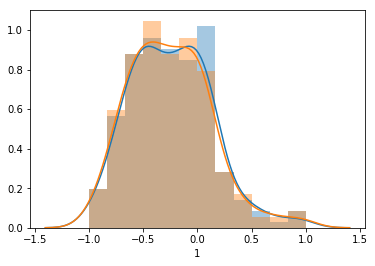

In [158]:
from sklearn import preprocessing
min_max_scaler = preprocessing.MinMaxScaler(feature_range=(-1,1))
temp_df1 =  breast_df[['radius_mean', 'perimeter_mean']].loc[breast_df.diagnosis == 1]
temp_df2 =  breast_df[['radius_mean', 'perimeter_mean']].loc[breast_df.diagnosis == 0]
np_scaled = min_max_scaler.fit_transform(temp_df1)
df_norm = pd.DataFrame(np_scaled)
print(df_norm[:5])
sns.distplot(df_norm[0],hist=True,kde=True )
sns.distplot(df_norm[1],hist=True,kde=True )
plt.show()

/home/darya/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


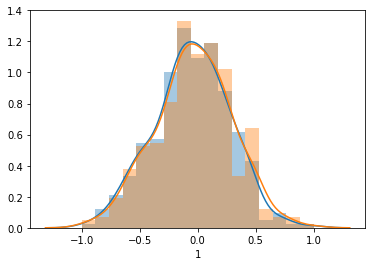

In [159]:
np_scaled = min_max_scaler.fit_transform(temp_df2)
df_norm = pd.DataFrame(np_scaled)
sns.distplot(df_norm[0],hist=True,kde=True )
sns.distplot(df_norm[1],hist=True,kde=True )

fractal_dimension_se - не значимая фича

In [160]:
import statsmodels.api as sm
import statsmodels.formula.api as smf

In [161]:
est = smf.ols('diagnosis ~ area_mean + symmetry_mean + perimeter_mean + fractal_dimension_se', data=breast_df).fit()
est_res = est.summary()
est_res.tables[1]

,coef,std err,t,P>|t|,[0.025,0.975]
Intercept,-2.1192,0.164,-12.926,0.000,-2.441,-1.797
area_mean,-0.0009,0.000,-4.137,0.000,-0.001,-0.000
symmetry_mean,3.1060,0.513,6.054,0.000,2.098,4.114
perimeter_mean,0.0276,0.003,8.348,0.000,0.021,0.034
fractal_dimension_se,2.4994,5.159,0.485,0.628,-7.633,12.632


fractal_dimension_se имеет большой 𝑝-value. Т.е. между fractal_dimension_se и diagnosis нет линейной зависимости и, следовательно, этого атрибута можно избавиться. Аналогично с symmetry_se.

In [162]:
est = smf.ols('diagnosis ~  area_mean + symmetry_mean + perimeter_mean + symmetry_se', data=breast_df).fit()
est_res = est.summary()
est_res.tables[1]

,coef,std err,t,P>|t|,[0.025,0.975]
Intercept,-2.1032,0.165,-12.770,0.000,-2.427,-1.780
area_mean,-0.0009,0.000,-3.941,0.000,-0.001,-0.000
symmetry_mean,3.4756,0.556,6.253,0.000,2.384,4.567
perimeter_mean,0.0269,0.003,8.026,0.000,0.020,0.034
symmetry_se,-1.8858,1.790,-1.053,0.293,-5.402,1.630


7.	Выбрать стратегию Feature Selection – сокращение размерности либо генерация новых переменных. Какой из этих двух подходов даст лучший результат при классификации?

Сокрашение. Дублирующася информация, мнго фич, а данных относительно мало

8. Рассчитать Feature Selection для выбранных переменных.

train test split

In [163]:
from sklearn.model_selection import train_test_split

In [164]:
y = breast_df['diagnosis'].copy()
X_train, X_test, y_train, y_test   = train_test_split(breast_df, y, test_size=0.2, random_state=42)
X_train.shape, X_test.shape

((455, 32), (114, 32))

In [165]:
X_train.columns

Index(['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst'],
      dtype='object')

In [166]:
drop_list = ['id', 'diagnosis', 'smoothness_se', 'concave points_se' ,'compactness_se', 'symmetry_mean', 'symmetry_se', 'fractal_dimension_se']
X_train.drop(drop_list, axis=1, inplace=True)
X_test.drop(drop_list, axis=1, inplace=True)

/home/darya/anaconda3/lib/python3.7/site-packages/pandas/core/frame.py:3697: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)


random forest

In [167]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_auc_score, roc_curve

In [168]:
cols = list(filter(lambda x: x in X_test.columns, X_train.columns))
cols

In [169]:
clf = RandomForestClassifier(n_estimators=100, max_depth=3, random_state=0)\
.fit(X_train[cols], y_train)

In [170]:
y_train_predict = clf.predict_proba(X_train[cols])[:, 1]

roc_auc_train = np.round(roc_auc_score(y_train, y_train_predict), 4)
print("Train: ", roc_auc_train)

Train:  0.9959


In [171]:
y_test_predict = clf.predict_proba(X_test[cols])[:, 1]

roc_auc_test = np.round(roc_auc_score(y_test, y_test_predict), 4)
print("Test: ", roc_auc_test)

Test:  0.9967


Модель явно перобучена (избыточна), дальше стрижём лес..

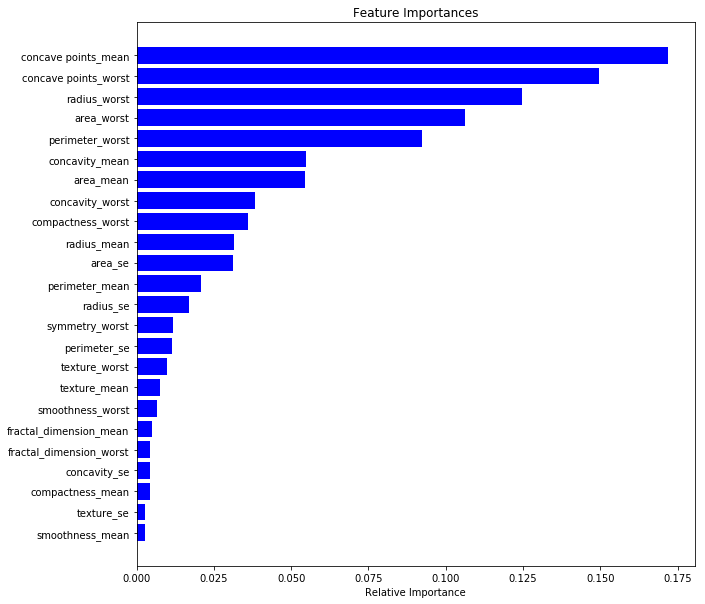

In [175]:
features = X_train.columns
importances = clf.feature_importances_

indices = np.argsort(importances)
plt.figure(figsize=(10,10))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

In [176]:
X_train.columns

Index(['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean',
       'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'fractal_dimension_mean', 'radius_se',
       'texture_se', 'perimeter_se', 'area_se', 'concavity_se', 'radius_worst',
       'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst'],
      dtype='object')

In [177]:
drop_list = ['smoothness_mean', 'texture_se', 'compactness_mean', 'concavity_se' ,'fractal_dimension_worst', 'fractal_dimension_mean', 'smoothness_worst', 'texture_mean']
X_train.drop(drop_list, axis=1, inplace=True)
X_test.drop(drop_list, axis=1, inplace=True)

/home/darya/anaconda3/lib/python3.7/site-packages/pandas/core/frame.py:3697: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)


In [178]:
cols = list(filter(lambda x: x in X_test.columns, X_train.columns))
cols

['radius_mean',
 'perimeter_mean',
 'area_mean',
 'concavity_mean',
 'concave points_mean',
 'radius_se',
 'perimeter_se',
 'area_se',
 'radius_worst',
 'texture_worst',
 'perimeter_worst',
 'area_worst',
 'compactness_worst',
 'concavity_worst',
 'concave points_worst',
 'symmetry_worst']

In [179]:
clf = RandomForestClassifier(n_estimators=200, max_depth=2, random_state=0)\
.fit(X_train[cols], y_train)

y_train_predict = clf.predict_proba(X_train[cols])[:, 1]
roc_auc_train = np.round(roc_auc_score(y_train, y_train_predict), 4)
print("Train: ", roc_auc_train)

y_test_predict = clf.predict_proba(X_test[cols])[:, 1]
roc_auc_test = np.round(roc_auc_score(y_test, y_test_predict), 4)
print("Test: ", roc_auc_test)

Train:  0.9918
Test:  0.9967


Переобучена

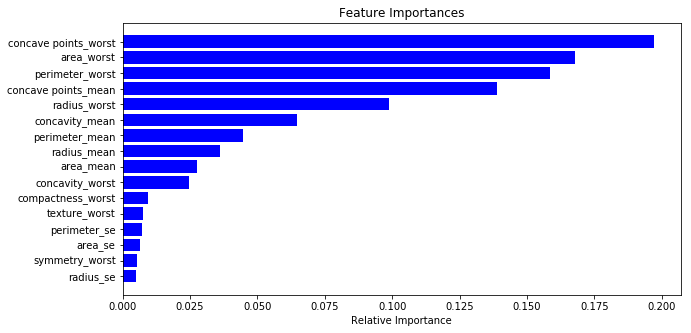

In [180]:
features = X_train.columns
importances = clf.feature_importances_

indices = np.argsort(importances)
plt.figure(figsize=(10,5))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

In [181]:
X_train.columns

Index(['radius_mean', 'perimeter_mean', 'area_mean', 'concavity_mean',
       'concave points_mean', 'radius_se', 'perimeter_se', 'area_se',
       'radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst'],
      dtype='object')

In [182]:
drop_list = ['radius_se', 'symmetry_worst', 'area_se', 'perimeter_se' ,'texture_worst', 'compactness_worst', 'concavity_worst', 'area_mean']
X_train.drop(drop_list, axis=1, inplace=True)
X_test.drop(drop_list, axis=1, inplace=True)

/home/darya/anaconda3/lib/python3.7/site-packages/pandas/core/frame.py:3697: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)


In [183]:
cols = list(filter(lambda x: x in X_test.columns, X_train.columns))
cols

['radius_mean',
 'perimeter_mean',
 'concavity_mean',
 'concave points_mean',
 'radius_worst',
 'perimeter_worst',
 'area_worst',
 'concave points_worst']

In [184]:
clf = RandomForestClassifier(n_estimators=200, max_depth=2, random_state=0)\
.fit(X_train[cols], y_train)

y_train_predict = clf.predict_proba(X_train[cols])[:, 1]
roc_auc_train = np.round(roc_auc_score(y_train, y_train_predict), 4)
print("Train: ", roc_auc_train)

y_test_predict = clf.predict_proba(X_test[cols])[:, 1]
roc_auc_test = np.round(roc_auc_score(y_test, y_test_predict), 4)
print("Test: ", roc_auc_test)

Train:  0.9885
Test:  0.9957


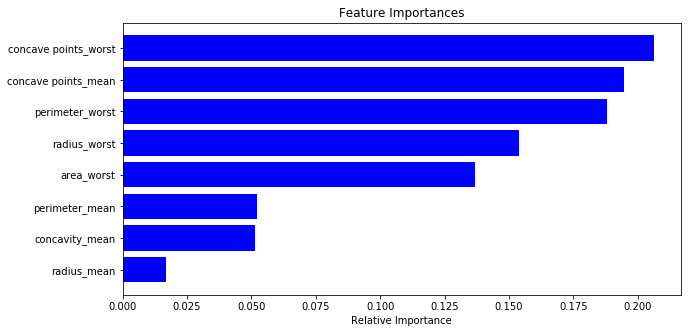

In [185]:
features = X_train.columns
importances = clf.feature_importances_

indices = np.argsort(importances)
plt.figure(figsize=(10,5))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

In [186]:
drop_list = ['radius_mean', 'concavity_mean', 'perimeter_mean', 'area_worst']
X_train.drop(drop_list, axis=1, inplace=True)
X_test.drop(drop_list, axis=1, inplace=True)

/home/darya/anaconda3/lib/python3.7/site-packages/pandas/core/frame.py:3697: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)


In [187]:
cols = list(filter(lambda x: x in X_test.columns, X_train.columns))
cols

['concave points_mean',
 'radius_worst',
 'perimeter_worst',
 'concave points_worst']

In [188]:
clf = RandomForestClassifier(n_estimators=100, max_depth=1, random_state=0)\
.fit(X_train[cols], y_train)

y_train_predict = clf.predict_proba(X_train[cols])[:, 1]
roc_auc_train = np.round(roc_auc_score(y_train, y_train_predict), 4)
print("Train: ", roc_auc_train)

y_test_predict = clf.predict_proba(X_test[cols])[:, 1]
roc_auc_test = np.round(roc_auc_score(y_test, y_test_predict), 4)
print("Test: ", roc_auc_test)

Train:  0.9818
Test:  0.9894


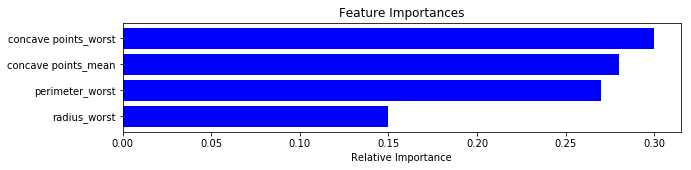

In [190]:
features = X_train.columns
importances = clf.feature_importances_

indices = np.argsort(importances)
plt.figure(figsize=(10,2))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

In [191]:
drop_list = ['radius_worst']
X_train.drop(drop_list, axis=1, inplace=True)
X_test.drop(drop_list, axis=1, inplace=True)

/home/darya/anaconda3/lib/python3.7/site-packages/pandas/core/frame.py:3697: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)


In [192]:
cols = list(filter(lambda x: x in X_test.columns, X_train.columns))
cols

['concave points_mean', 'perimeter_worst', 'concave points_worst']

In [193]:
clf = RandomForestClassifier(n_estimators=100, max_depth=1, random_state=0)\
.fit(X_train[cols], y_train)

y_train_predict = clf.predict_proba(X_train[cols])[:, 1]
roc_auc_train = np.round(roc_auc_score(y_train, y_train_predict), 4)
print("Train: ", roc_auc_train)

y_test_predict = clf.predict_proba(X_test[cols])[:, 1]
roc_auc_test = np.round(roc_auc_score(y_test, y_test_predict), 4)
print("Test: ", roc_auc_test)

Train:  0.9811
Test:  0.9907


In [194]:
cols = ['concave points_worst']

In [195]:
clf = RandomForestClassifier(n_estimators=100, max_depth=1, random_state=0)\
.fit(X_train[cols], y_train)

y_train_predict = clf.predict_proba(X_train[cols])[:, 1]
roc_auc_train = np.round(roc_auc_score(y_train, y_train_predict), 4)
print("Train: ", roc_auc_train)

y_test_predict = clf.predict_proba(X_test[cols])[:, 1]
roc_auc_test = np.round(roc_auc_score(y_test, y_test_predict), 4)
print("Test: ", roc_auc_test)

Train:  0.9499
Test:  0.954


In [196]:
cols = ['perimeter_worst']

In [197]:
clf = RandomForestClassifier(n_estimators=100, max_depth=1, random_state=0)\
.fit(X_train[cols], y_train)

y_train_predict = clf.predict_proba(X_train[cols])[:, 1]
roc_auc_train = np.round(roc_auc_score(y_train, y_train_predict), 4)
print("Train: ", roc_auc_train)

y_test_predict = clf.predict_proba(X_test[cols])[:, 1]
roc_auc_test = np.round(roc_auc_score(y_test, y_test_predict), 4)
print("Test: ", roc_auc_test)

Train:  0.9605
Test:  0.9849


In [198]:
cols = ['concave points_mean']

In [199]:
clf = RandomForestClassifier(n_estimators=100, max_depth=1, random_state=0)\
.fit(X_train[cols], y_train)

y_train_predict = clf.predict_proba(X_train[cols])[:, 1]
roc_auc_train = np.round(roc_auc_score(y_train, y_train_predict), 4)
print("Train: ", roc_auc_train)

y_test_predict = clf.predict_proba(X_test[cols])[:, 1]
roc_auc_test = np.round(roc_auc_score(y_test, y_test_predict), 4)
print("Test: ", roc_auc_test)

Train:  0.9297
Test:  0.9292


In [200]:
cols = ['perimeter_worst', 'concave points_worst']

In [209]:
clf = RandomForestClassifier(n_estimators=10, max_depth=1, random_state=0)\
.fit(X_train[cols], y_train)

y_train_predict = clf.predict_proba(X_train[cols])[:, 1]
roc_auc_train = np.round(roc_auc_score(y_train, y_train_predict), 4)
print("Train roc_auc: ", roc_auc_train )

y_test_predict = clf.predict_proba(X_test[cols])[:, 1]
roc_auc_test = np.round(roc_auc_score(y_test, y_test_predict), 4)
print("Test roc_auc: ", roc_auc_test)

Train roc_auc:  0.973
Test roc_auc:  0.9931


вероятность каждого класса

In [210]:
clf.predict_proba(X_test[cols])

array([[0.91442256, 0.08557744],
       [0.05623216, 0.94376784],
       [0.05623216, 0.94376784],
       [0.91442256, 0.08557744],
       [0.91442256, 0.08557744],
       [0.05623216, 0.94376784],
       [0.05623216, 0.94376784],
       [0.05623216, 0.94376784],
       [0.40099367, 0.59900633],
       [0.91442256, 0.08557744],
       [0.91442256, 0.08557744],
       [0.05623216, 0.94376784],
       [0.91442256, 0.08557744],
       [0.74571311, 0.25428689],
       [0.91442256, 0.08557744],
       [0.05623216, 0.94376784],
       [0.91442256, 0.08557744],
       [0.91442256, 0.08557744],
       [0.91442256, 0.08557744],
       [0.05623216, 0.94376784],
       [0.74571311, 0.25428689],
       [0.91442256, 0.08557744],
       [0.05623216, 0.94376784],
       [0.91442256, 0.08557744],
       [0.91442256, 0.08557744],
       [0.91442256, 0.08557744],
       [0.91442256, 0.08557744],
       [0.91442256, 0.08557744],
       [0.91442256, 0.08557744],
       [0.05623216, 0.94376784],
       [0.

Accuracy

In [211]:
from sklearn.metrics import accuracy_score

In [218]:
# y_train_predict = clf.predict_proba(X_train[cols])[:, 1]
accuracy_train = np.round(accuracy_score(y_train, y_train_predict.round()), 4)
print("Train accuracy: ", accuracy_train )

# y_test_predict = clf.predict_proba(X_test[cols])[:, 1]
accuracy_test = np.round(accuracy_score(y_test, y_test_predict.round()), 4)
print("Test accuracy: ", accuracy_test)

Train accuracy:  0.9231
Test accuracy:  0.9211


F1-Score

In [214]:
 from sklearn.metrics import f1_score

In [229]:
# y_train_predict = clf.predict_proba(X_train[cols])[:, 1]
f1_score_train = np.round(f1_score(y_train, y_train_predict.round(), average='micro'), 4)
print("Train f1_score: ", f1_score_train )

# y_test_predict = clf.predict_proba(X_test[cols])[:, 1]
f1_score_test = np.round(f1_score(y_test, y_test_predict.round(), average='micro'), 4)
print("Test f1_score: ", f1_score_test)

Train f1_score:  0.9231
Test f1_score:  0.9211


Precision

In [226]:
from sklearn.metrics import precision_score

In [235]:
# y_train_predict = clf.predict_proba(X_train[cols])[:, 1]
precision_train = np.round(precision_score(y_train, y_train_predict.round()), 4)
print("Train precision_score: ", precision_train )

# y_test_predict = clf.predict_proba(X_test[cols])[:, 1]
precision_test = np.round(precision_score(y_test, y_test_predict.round()), 4)
print("Test precision_score: ", precision_test)

Train precision_score:  0.9467
Test precision_score:  0.9474


Recall

In [236]:
from sklearn.metrics import recall_score

In [240]:
# y_train_predict = clf.predict_proba(X_train[cols])[:, 1]
recall_train = np.round(recall_score(y_train, y_train_predict.round(), average='micro'), 4)
print("Train recall_score: ", recall_train )

# y_test_predict = clf.predict_proba(X_test[cols])[:, 1]
recall_test = np.round(recall_score(y_test, y_test_predict.round(), average='micro'), 4)
print("Test recall_score: ", recall_test)

Train recall_score:  0.9231
Test recall_score:  0.9211


Получается использование 2х фич с глубиной леса 1, с количеством деревьев 10, даёт 99 для теста по ROC_AUC и больше 90 для Accuracy, F1-Score, Precision, Recall

9. Решить задачу бинарной классификации и предсказать переменную ”Diagnosis ” протестировав как минимум 2 алгоритма. Использовать те алгоритмы, которые позволяют предсказать вероятность класса (proba). Рассчитать и вывести вероятность каждого класса.

Выше была модель случйный лес с пробой. Посмотрим LogisticRegression

In [241]:
from sklearn.linear_model import LogisticRegression

In [248]:
y = breast_df['diagnosis'].copy()
X_train, X_test, y_train, y_test   = train_test_split(breast_df, y, test_size=0.2, random_state=42)
X_train.shape, X_test.shape

((455, 32), (114, 32))

In [249]:
drop_list = ['id', 'diagnosis', 'smoothness_se', 'concave points_se' ,'compactness_se', 'symmetry_mean', 'symmetry_se', 'fractal_dimension_se', 'smoothness_mean', 'texture_se', 'compactness_mean', 'concavity_se' ,'fractal_dimension_worst', 'fractal_dimension_mean', 'smoothness_worst', 'texture_mean', 'radius_se', 'symmetry_worst', 'area_se', 'perimeter_se' ,'texture_worst', 'compactness_worst', 'concavity_worst', 'area_mean', 'area_worst', 'radius_mean', 'perimeter_mean', 'concavity_mean', 'concave points_mean', 'radius_worst']
X_train.drop(drop_list, axis=1, inplace=True)
X_test.drop(drop_list, axis=1, inplace=True)

In [250]:
cols = list(filter(lambda x: x in X_test.columns, X_train.columns))
cols

['perimeter_worst', 'concave points_worst']

In [258]:
lr = LogisticRegression(random_state=42, solver='lbfgs', multi_class='multinomial').fit(X_train[cols], y_train)
y_train_predict = lr.predict_proba(X_train[cols])[:, 1]
y_test_predict = lr.predict_proba(X_test[cols])[:, 1]
# y_test_predict

10. Проверить качество классификации с использованием следующих метрик: Accuracy, F1-Score, Precision, Recall

In [259]:
accuracy_train = np.round(accuracy_score(y_train, y_train_predict.round()), 4)
print("Train accuracy: ", accuracy_train )
accuracy_test = np.round(accuracy_score(y_test, y_test_predict.round()), 4)
print("Test accuracy: ", accuracy_test)

f1_score_train = np.round(f1_score(y_train, y_train_predict.round(), average='micro'), 4)
print("Train f1_score: ", f1_score_train )
f1_score_test = np.round(f1_score(y_test, y_test_predict.round(), average='micro'), 4)
print("Test f1_score: ", f1_score_test)

precision_train = np.round(precision_score(y_train, y_train_predict.round()), 4)
print("Train precision_score: ", precision_train )
precision_test = np.round(precision_score(y_test, y_test_predict.round()), 4)
print("Test precision_score: ", precision_test)

recall_train = np.round(recall_score(y_train, y_train_predict.round(), average='micro'), 4)
print("Train recall_score: ", recall_train )
recall_test = np.round(recall_score(y_test, y_test_predict.round(), average='micro'), 4)
print("Test recall_score: ", recall_test)

Train accuracy:  0.9121
Test accuracy:  0.9649
Train f1_score:  0.9121
Test f1_score:  0.9649
Train precision_score:  0.9006
Test precision_score:  1.0
Train recall_score:  0.9121
Test recall_score:  0.9649
